<a href="https://colab.research.google.com/github/lindseycarlson23/bank-churn/blob/main/AML_Project_LearnerNotebook_FullCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [ ]:
# This will help in making the Python code more structured automatically (good coding practice)
# %load_ext nb_black

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer
from sklearn import metrics

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

## Loading the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
attrition = pd.read_csv("/gdrive/MyDrive/AIML_Program/Advanced_Machine_Learning/BankChurners.csv")

In [ ]:
data = attrition.copy()

In [ ]:
data.shape

(10127, 21)

*   The data has 10,127 rows and 21 columns.

## Data Overview

- Observations
- Sanity checks

### Displaying the few and last few rows of the dataset

In [ ]:
# view the first 5 rows
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
# view the last 5 rows
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


### Checking the data types of the columns for the dataset

In [ ]:
# check the data types of the columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

*   6 columns are object types.
*   2 columns are missing data.

### Checking for duplicate values

In [ ]:
data.duplicated().sum()

0

### Checking for missing values

In [ ]:
# show the percentage of missing values by column
round(data.isnull().sum() / data.isnull().count() * 100, 2)

,0
CLIENTNUM,0.000
Attrition_Flag,0.000
Customer_Age,0.000
Gender,0.000
Dependent_count,0.000
Education_Level,15.000
Marital_Status,7.400
Income_Category,0.000
Card_Category,0.000
Months_on_book,0.000


*   Education_Level has 15% missing values out of the total observations.
*   Marital_Status has 7.4% missing values out of the total observations.

In [ ]:
# statistical summary of the numerical columns in the data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


*   Customer_Age spans from 26 to 73, with the average and mode at 46.
*   Dependent_Count has an average of 2.346 and amode of 2, showing it to be right skewed.
*   Months_on_book has a normal distribution.
*   Total_Relationship_Count is slightly right skewed.
*   Months_Inactive_12_mon is slightly right skewed.
*   Contacts_Count_12_mon is slightly right skewed.
*   Credit_Limit ranges between 1438.3 and 34516, with an average of 1162 and a mode of 4549, showing it to be right skewed.
*   Total_Revolving_Bal is nearly normally distributed.
*   Avg_Open_To_Buy is also very right skewed.
*   Total_Amt_Chng_Q4_Q1 is right skewed.
*   Total_Trans_Ct is nearly normally distributed.
*   Total_Ct_Chang_Q4_Q1 is right skewed.

In [ ]:
# list of all categorical variable
cat_col = data.select_dtypes(include=['object']).columns

# printing the number of occurrences of each unique value in each categorical column
for column in cat_col:
    print(data[column].value_counts(normalize=False))
    print("-" * 50)

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
--------------------------------------------------
Gender
F    5358
M    4769
Name: count, dtype: int64
--------------------------------------------------
Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
--------------------------------------------------
Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64
--------------------------------------------------
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64
--------------------------------------------------
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64
---------------------------------------------

In [ ]:
# drop CLIENTNUM as it is a unique identifier for each customer and won't add value to modeling
data.drop(["CLIENTNUM"], axis=1, inplace=True)

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

### Univariate analysis

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Observations on Attrition_Flag

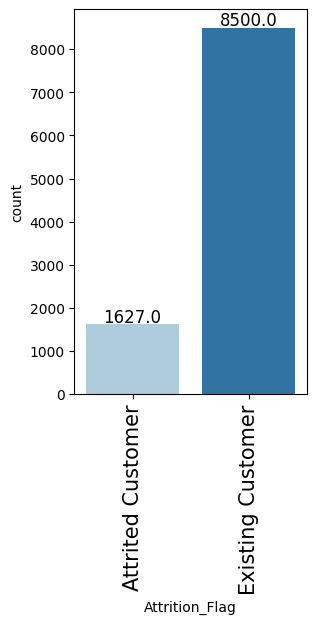

In [ ]:
labeled_barplot(data, "Attrition_Flag")

*   The data is highly imbalanced.

### Observations on Customer_Age

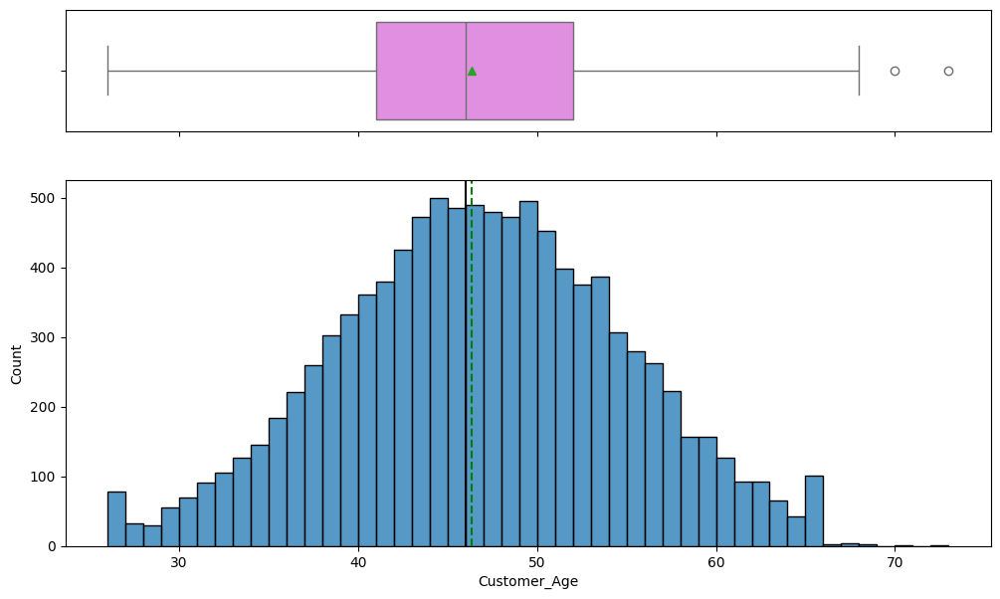

In [ ]:
histogram_boxplot(data, "Customer_Age")

*   This is normally distributed.
*   Average age is ~46.

### Observations on Gender

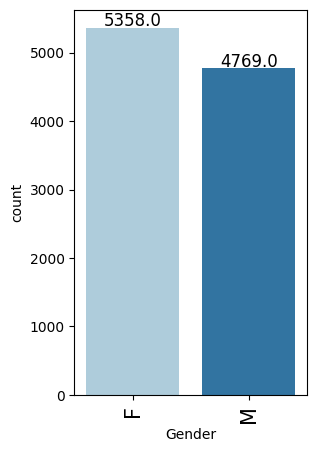

In [ ]:
labeled_barplot(data, "Gender")

*   52.9% of the customers are female.
*   47.1% of the customers are male.

### Observations on Dependent_count

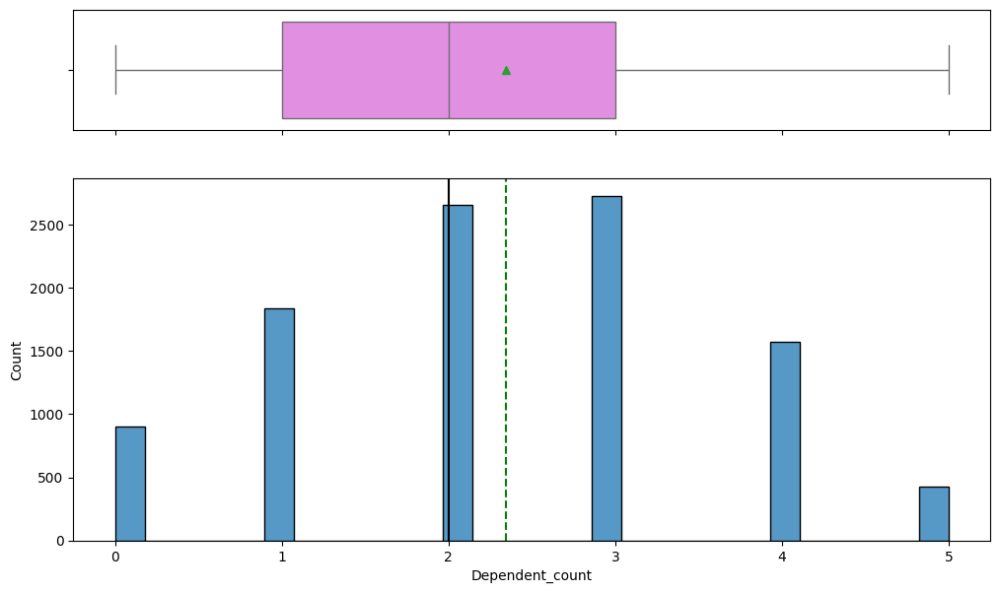

In [ ]:
histogram_boxplot(data, "Dependent_count")

*   Data is left-skewed. Most frequent number of dependents is 2.

### Education_Level

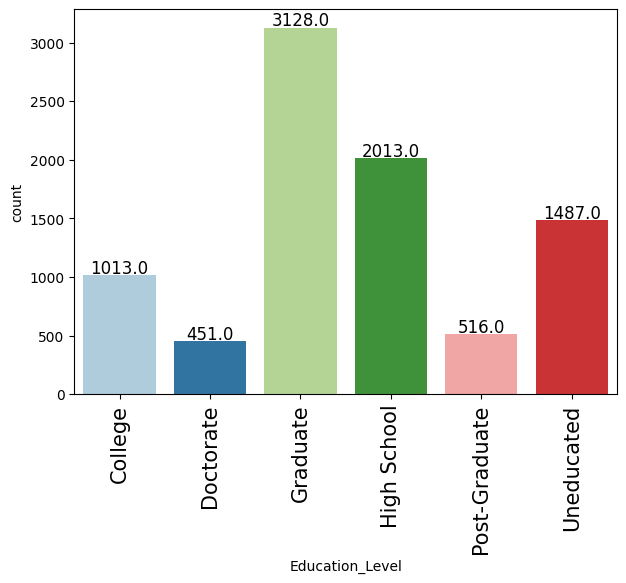

In [ ]:
labeled_barplot(data, "Education_Level")

*   The most frequent education level is Graduate, representing ~31% of the customers.
*   ~15% are uneducated.
*   There are also 15% missing values.

### Observations on Marital_Status

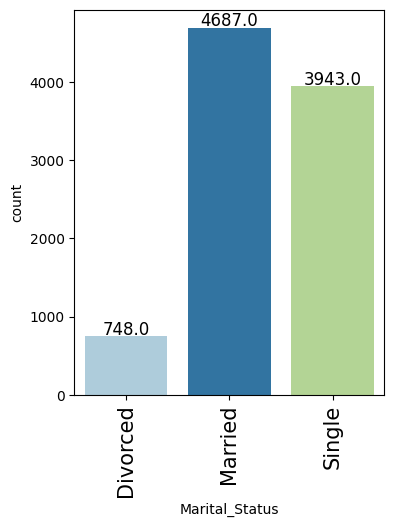

In [ ]:
labeled_barplot(data, "Marital_Status")

*   ~7.4% of the customers with Martial_Status provided are divorced.
*   ~46% are married.
*   ~39% are single.
*   ~7.4% do not have a marital status listed.

### Income_Category

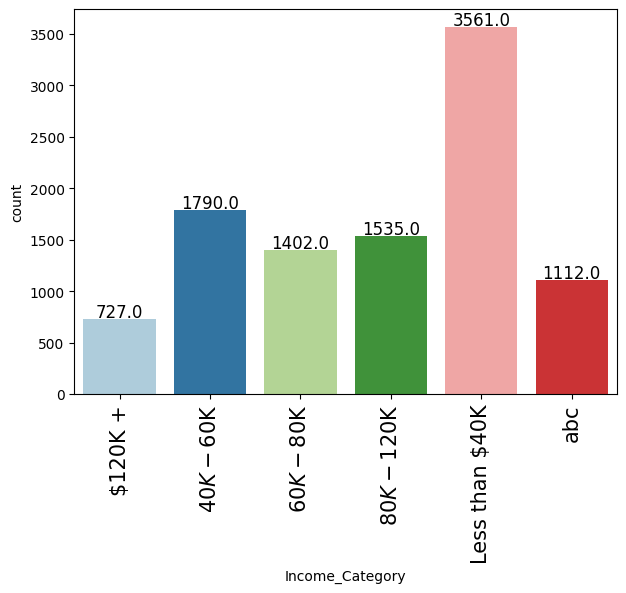

In [ ]:
labeled_barplot(data, "Income_Category")

*   There are 6 different income categories.
*   The category with the highest percentage of customer is Less than $40k, ~35% of the customers.
*   'abc' likely indicates missing data. This will need to be replaced.

In [ ]:
# replace abc with NaN
data['Income_Category'] = data['Income_Category'].replace('abc', np.nan)

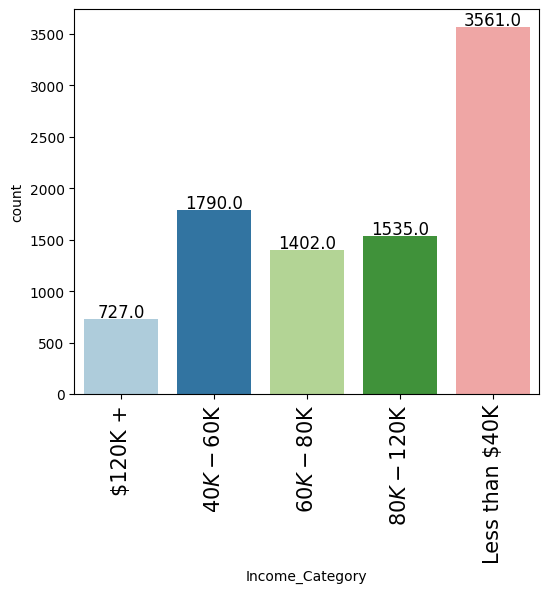

In [ ]:
labeled_barplot(data, "Income_Category")

*   There are 1112 missing values for Income_Category.

### Observatinos on Card_Category

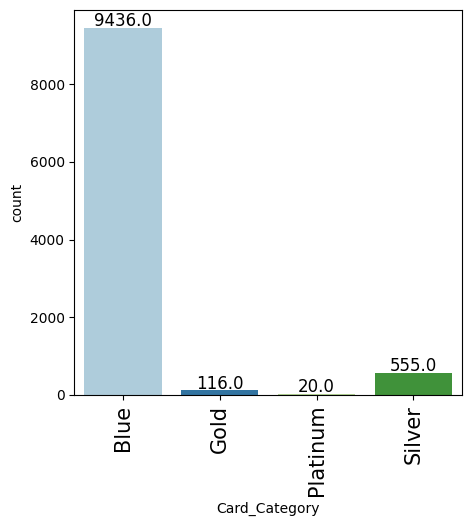

In [ ]:
labeled_barplot(data, 'Card_Category')

*   93% of customers have blue cards.

### Observations on Months_on_book

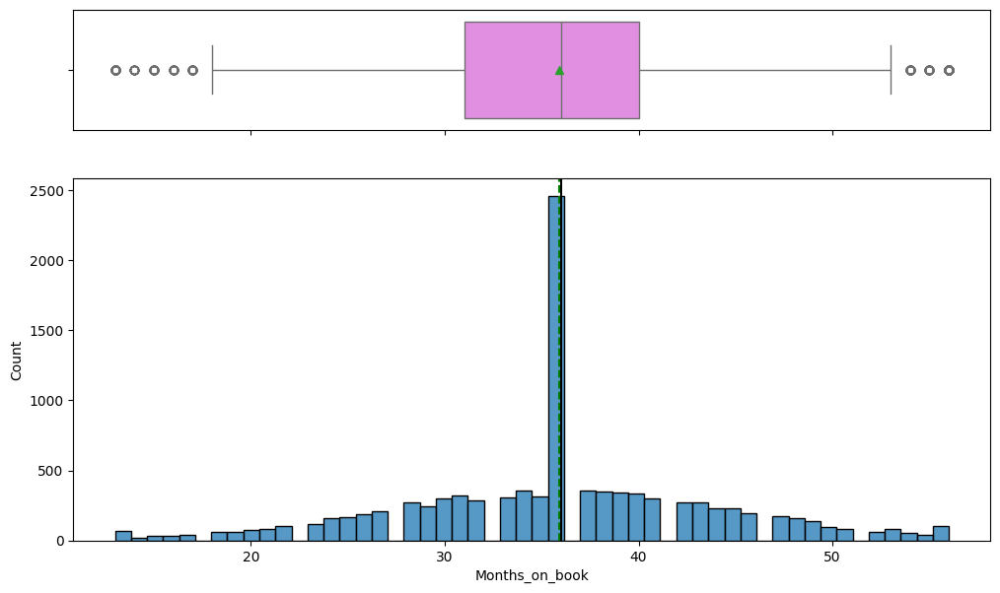

In [ ]:
histogram_boxplot(data, "Months_on_book")

*   Normally distributed.
*   Vast majority on 36 months.

### Observations on Total_Relationship_Count

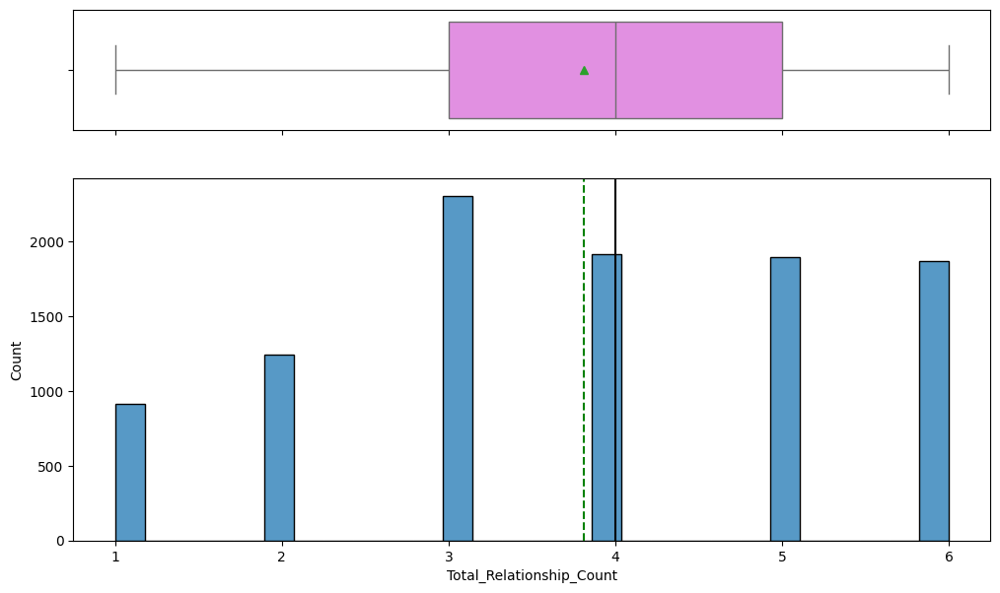

In [ ]:
histogram_boxplot(data, "Total_Relationship_Count")

* Right skewed, 3 is the most frequent.

### Observations on Months_Inactive_12_mon

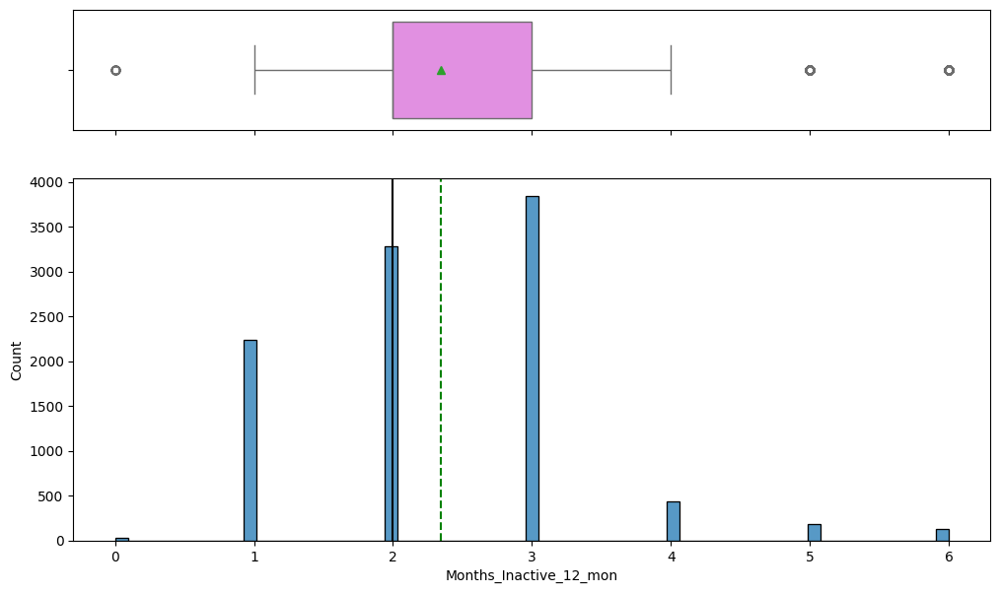

In [ ]:
histogram_boxplot(data, "Months_Inactive_12_mon")

*   Slightly right skewed.
*   Most frequent is 3.

### Observations on Contacts_Count_12_mon

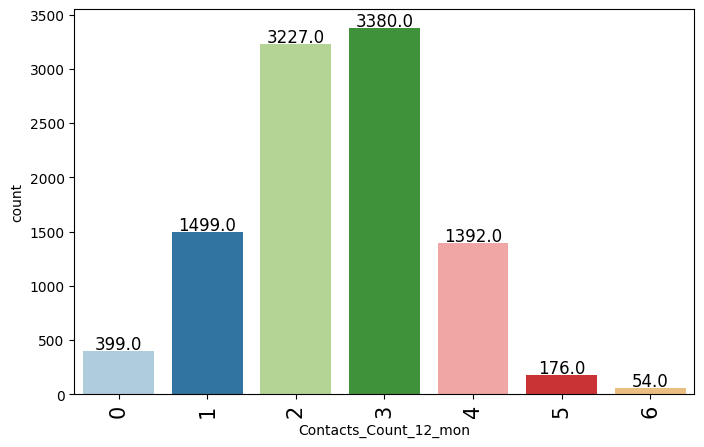

In [ ]:
labeled_barplot(data, "Contacts_Count_12_mon")

*   Most customers made 2-3 contacts in a 12 month period.

### Observations on Credit_Limit

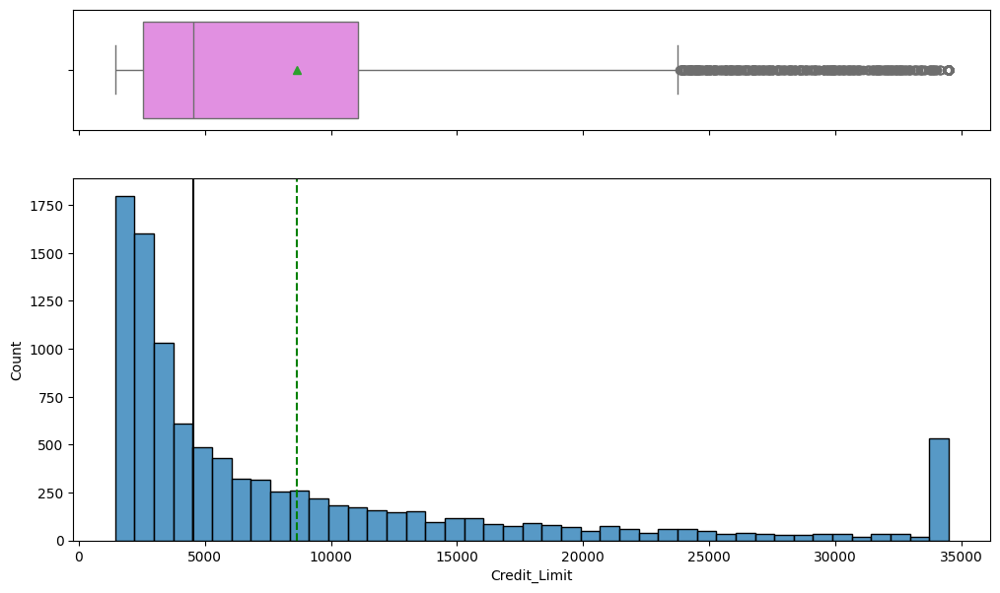

In [ ]:
histogram_boxplot(data, "Credit_Limit")

*   Very right skewed with a high number of outliers.

### Observations on Total_Revolving_Bal

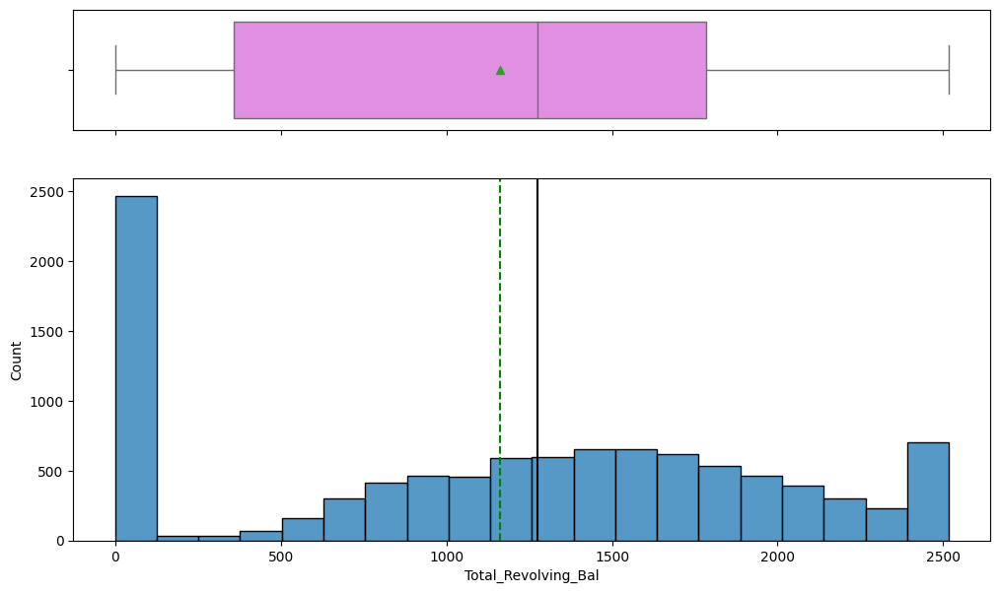

In [ ]:
histogram_boxplot(data, "Total_Revolving_Bal")

*   About 2500 out of 10127 have a balance of zero. This is about 25% of the customers.

### Observations on Avg_Open_To_Buy

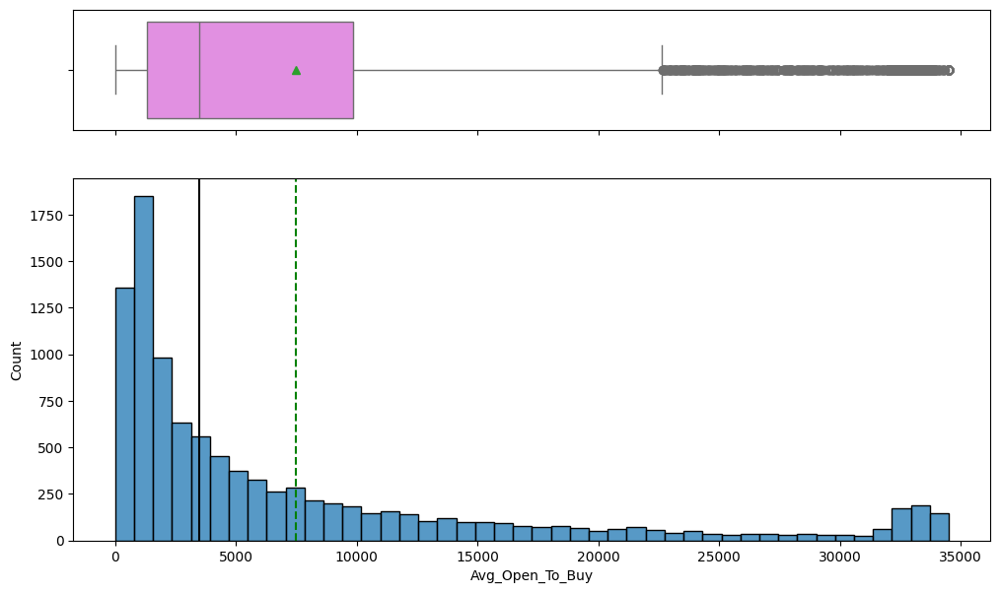

In [ ]:
histogram_boxplot(data, "Avg_Open_To_Buy")

*   Also very right skewed, with a significant number of outliers.

### Observations on Total_Trans_Amt

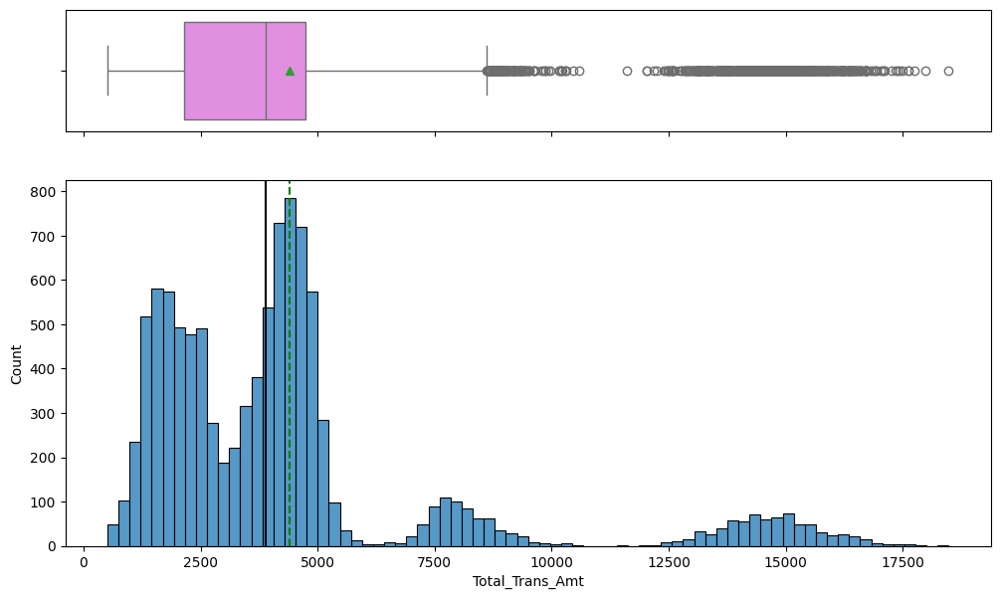

In [ ]:
histogram_boxplot(data, "Total_Trans_Amt")

*  This distribution is multimodal, suggesting different groups with specific behaviors.

### Observations on Total_Trans_Ct

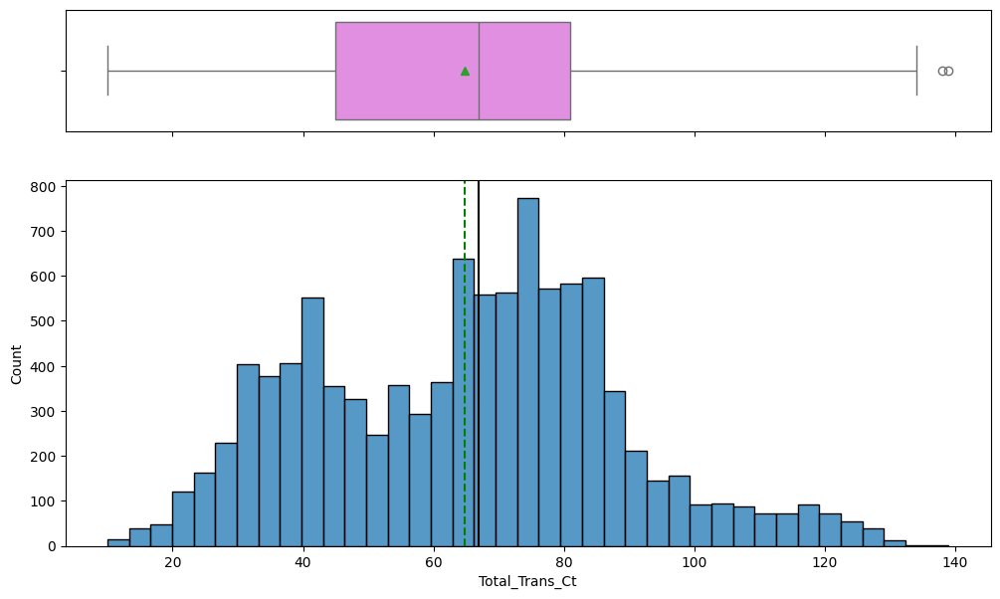

In [ ]:
histogram_boxplot(data, "Total_Trans_Ct")

*   Nearly normal distribution with the average around 65.

### Observations on Total_Ct_Chng_Q4_Q1

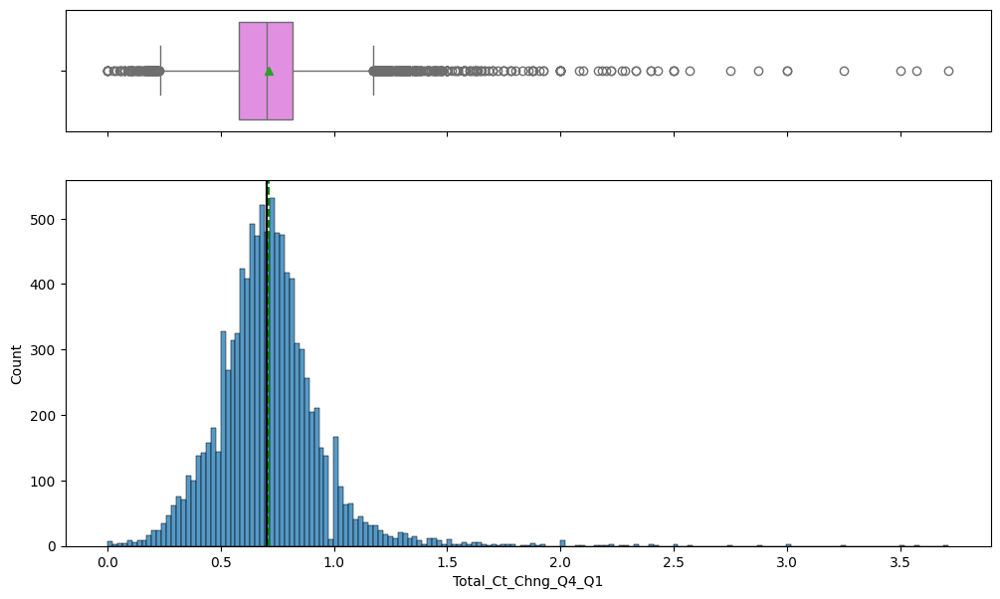

In [ ]:
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1")

*   Right skewed, many outliers to the right and some to the left.
*   Average ratio is about 0.7.

### Observations on Total_Amt_Chng_Q4_Q1

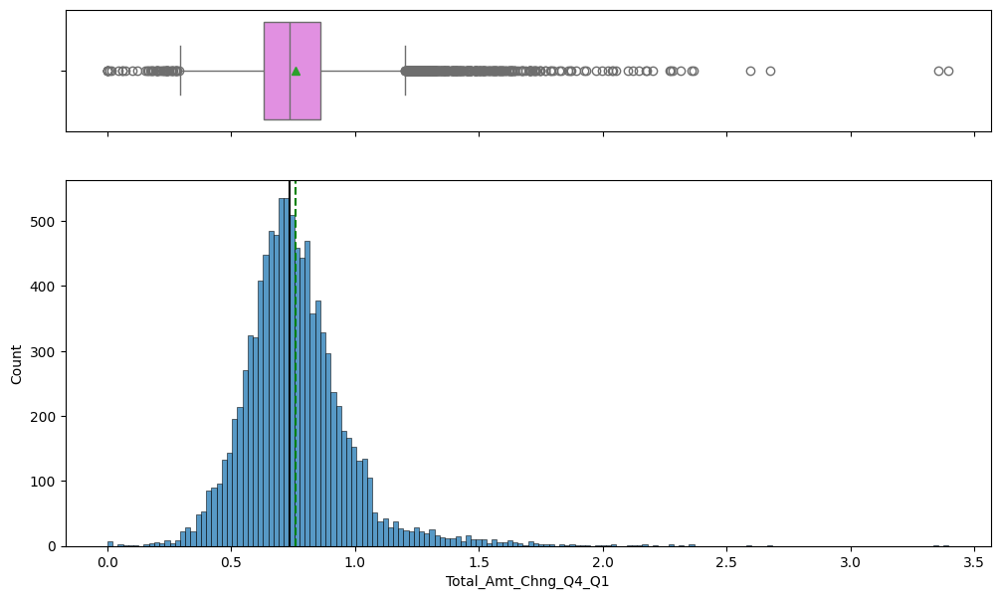

In [ ]:
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1")

*   Similar to previous

### Observations on Avg_Utilization_Ratio

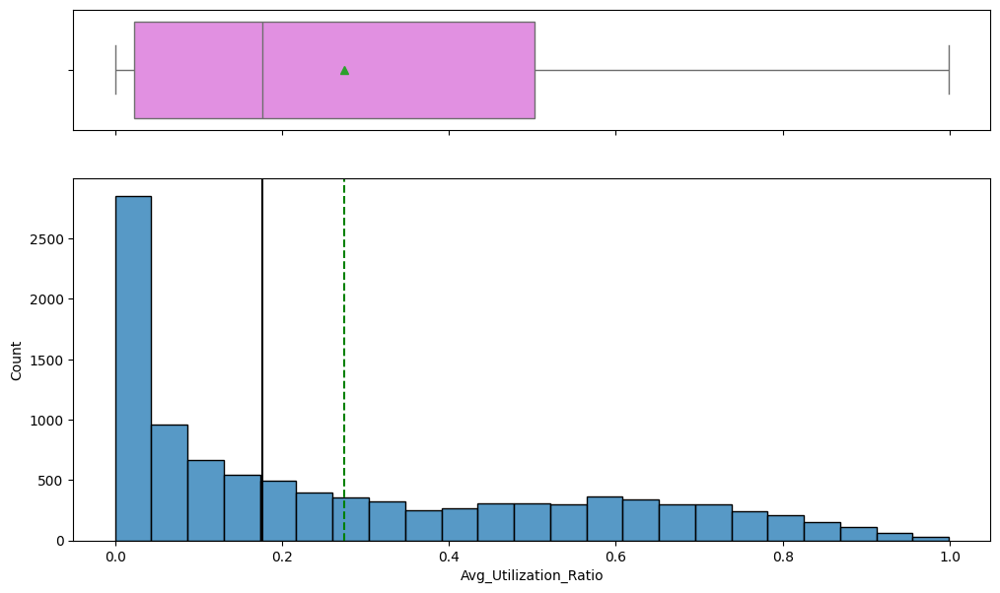

In [ ]:
histogram_boxplot(data, "Avg_Utilization_Ratio")

*   Right skewed, average about 30%

### Bivariate Analysis

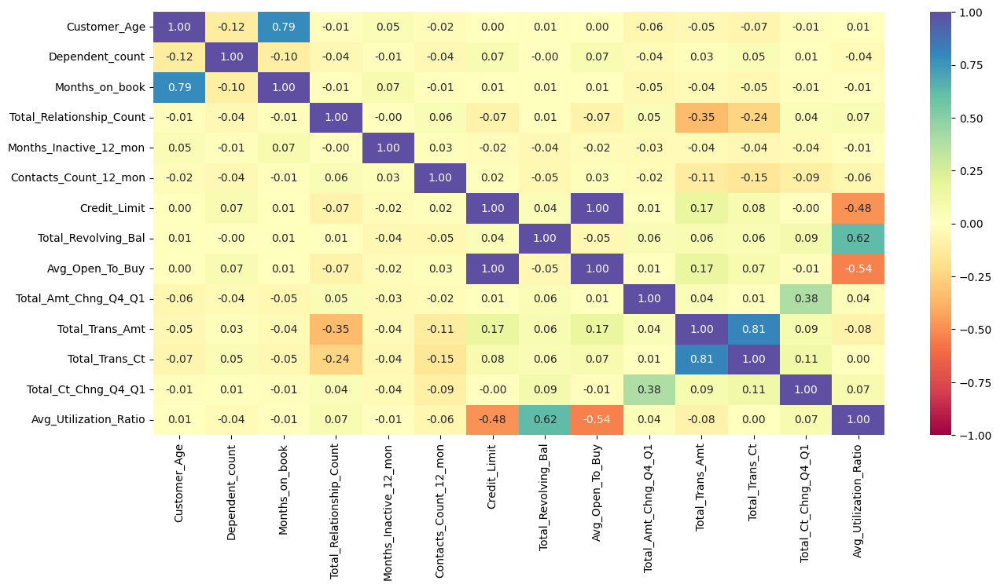

In [ ]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
numerical_data = data[numerical_columns]

plt.figure(figsize=(15, 7))
sns.heatmap(numerical_data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

*   Total_Trans_Amt and Total_Trans_Ct are highly correlately. This makes sense that one going up would correlate wtih the other going up.
*   Total_Revolving_Bal has a strong positive correlation with Avg_Utilization_Ratio.

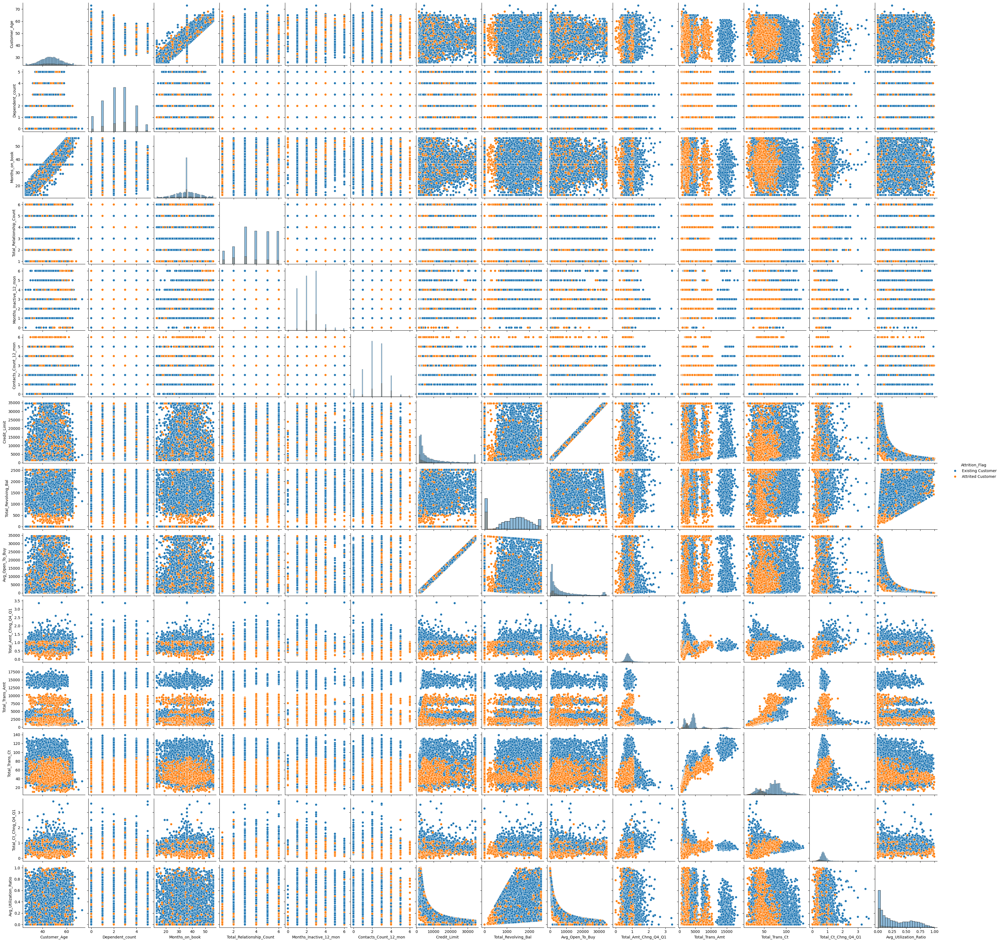

In [ ]:
# pairplot to see relationship between all features
sns.pairplot(data, hue='Attrition_Flag', diag_kind='hist')
plt.show()

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [ ]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))


    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

    plt.show()

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()


    plt.show()

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


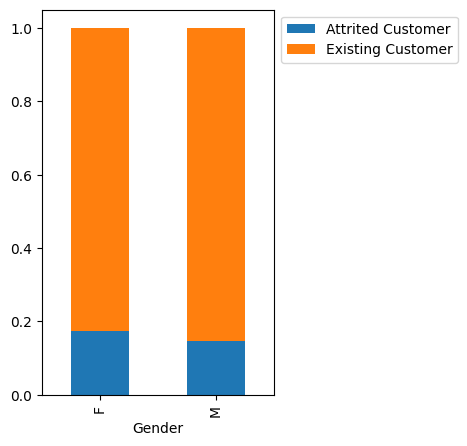

In [ ]:
stacked_barplot(data, "Gender", "Attrition_Flag")

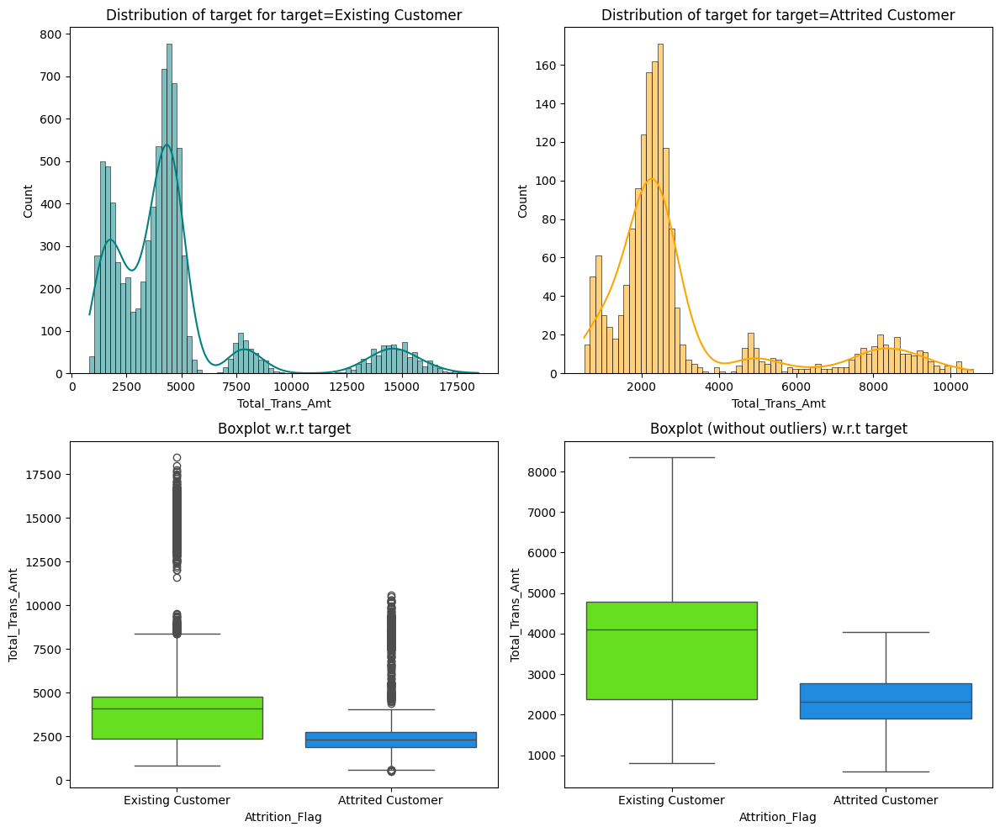

In [ ]:
distribution_plot_wrt_target(data, "Total_Trans_Amt", "Attrition_Flag")

### Attrition_Flag vs Customer_Age

Attrition_Flag  Attrited Customer  Existing Customer    All
Customer_Age                                               
All                          1627               8500  10127
43                             85                388    473
48                             85                387    472
44                             84                416    500
46                             82                408    490
45                             79                407    486
49                             79                416    495
47                             76                403    479
41                             76                303    379
50                             71                381    452
54                             69                238    307
40                             64                297    361
42                             62                364    426
53                             59                328    387
52                             58       

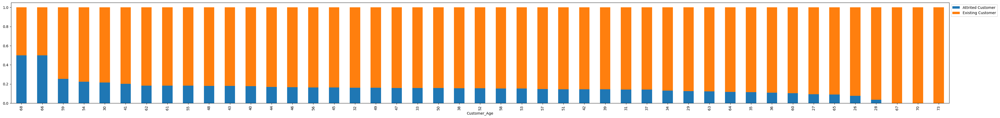

In [ ]:
stacked_barplot(data, "Customer_Age", "Attrition_Flag")

## Data Pre-processing

In [ ]:
# assign object data types to category type
data['Attrition_Flag'] = data['Attrition_Flag'].astype('category')
data['Gender'] = data['Gender'].astype('category')
data['Education_Level'] = data['Education_Level'].astype('category')
data['Marital_Status'] = data['Marital_Status'].astype('category')
data['Income_Category'] = data['Income_Category'].astype('category')
data['Card_Category'] = data['Card_Category'].astype('category')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  category
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           9015 non-null   category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

In [ ]:
# checking the distribution of the Attrition_Flag variable
data['Attrition_Flag'].value_counts(1)

,proportion
Attrition_Flag,
Existing Customer,0.839
Attrited Customer,0.161


### Splitting the data into X and y

In [ ]:
# seperating the independent and dependent variables
X = data.drop('Attrition_Flag', axis=1)
y = data['Attrition_Flag']

# creating dummy variables
# X = pd.get_dummies(X, drop_first=True)

In [ ]:
# Splitting data into training, validation and test set:

# first we split data into 2 parts, say temporary and test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.5, random_state=0, stratify=y
)

# then we split the temporary set into train and validation
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.4, random_state=0, stratify=y_temp
)

print(X_train.shape, X_val.shape, X_test.shape)

(5063, 19) (3038, 19) (2026, 19)


## Missing value imputation




In [ ]:
# cat_columns = data.select_dtypes(include=['category']).columns

  # ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

In [ ]:
# Let's impute the missing values
imp_frequent = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

# Columns to impute
cols_to_impute = ["Education_Level", "Marital_Status", "Income_Category"]

# fit the imputer on train data and transform the train data
X_train[cols_to_impute] = imp_frequent.fit_transform(X_train[cols_to_impute])

# transform the validation and test data using the imputer fit on train data
X_val[cols_to_impute] = imp_frequent.transform(X_val[cols_to_impute])
X_test[cols_to_impute] = imp_frequent.transform(X_test[cols_to_impute])

In [ ]:
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

In [ ]:
print("Target value ratio in y")
print(y.value_counts(1))
print("*" * 80)
print("Target value ratio in y_train")
print(y_train.value_counts(1))
print("*" * 80)
print("Target value ratio in y_val")
print(y_val.value_counts(1))
print("*" * 80)
print("Target value ratio in y_test")
print(y_test.value_counts(1))
print("*" * 80)

Target value ratio in y
Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_train
Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_val
Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_test
Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
********************************************************************************


### Creating Dummy Variables

In [ ]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(5063, 29) (3038, 29) (2026, 29)


*   After encoding, there are 29 columns.

In [ ]:
data['Attrition_Flag'].unique()

['Existing Customer', 'Attrited Customer']
Categories (2, object): ['Attrited Customer', 'Existing Customer']

In [ ]:
y_train.unique()

['Existing Customer', 'Attrited Customer']
Categories (2, object): ['Attrited Customer', 'Existing Customer']

In [ ]:
# change y values to binary

y_train = y_train.map({'Existing Customer': 0, 'Attrited Customer': 1})
y_val = y_val.map({'Existing Customer': 0, 'Attrited Customer': 1})
y_test = y_test.map({'Existing Customer': 0, 'Attrited Customer': 1})
print(X_train.shape, X_val.shape, X_test.shape)

(5063, 29) (3038, 29) (2026, 29)


In [ ]:
y_train.head()


,Attrition_Flag
2231,0
8510,0
8129,0
10108,1
4136,0


In [ ]:
# convert data type to numerical

y_train = y_train.astype(int)

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are attritions correctly predicted by the model.
- False negatives (FN) are real attritions in a customer where there is no detection by model.
- False positives (FP) are attrition detections in a customer where there is no attrition.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of customer attritions are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a customer will have no attrition when there will be attrition, it will increase the bank's loss.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Model Building with original data

Sample code for model building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("xgboost", XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=1)))

print("\nTraining Performance:\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\nValidation Performance:\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.974169741697417
Random forest: 1.0
GBM: 0.8856088560885609
Adaboost: 0.8757687576875769
dtree: 1.0
xgboost: 1.0

Validation Performance:

Bagging: 0.8114754098360656
Random forest: 0.7889344262295082
GBM: 0.8340163934426229
Adaboost: 0.8442622950819673
dtree: 0.7418032786885246
xgboost: 0.8688524590163934


In [ ]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_train = recall_score(y_train, model.predict(X_train))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference1 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference1))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9742, Validation Score: 0.8115, Difference: 0.1627
Random forest: Training Score: 1.0000, Validation Score: 0.7889, Difference: 0.2111
GBM: Training Score: 0.8856, Validation Score: 0.8340, Difference: 0.0516
Adaboost: Training Score: 0.8758, Validation Score: 0.8443, Difference: 0.0315
dtree: Training Score: 1.0000, Validation Score: 0.7418, Difference: 0.2582
xgboost: Training Score: 1.0000, Validation Score: 0.8689, Difference: 0.1311


### Model Building with Oversampled data


In [ ]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
print("Before Oversampling, counts of label 1: {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 0: {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After Oversampling, counts of label 1: {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 0: {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 1: 813
Before Oversampling, counts of label 0: 4250 

After Oversampling, counts of label 1: 4250
After Oversampling, counts of label 0: 4250 

After Oversampling, the shape of train_X: (8500, 29)
After Oversampling, the shape of train_y: (8500,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("xgboost", XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.9971764705882353
Random forest: 1.0
GBM: 0.9835294117647059
Adaboost: 0.9684705882352941
dtree: 1.0
xgboost: 1.0

Validation Performance:

Bagging: 0.8360655737704918
Random forest: 0.8627049180327869
GBM: 0.9118852459016393
Adaboost: 0.8770491803278688
dtree: 0.8237704918032787
xgboost: 0.9118852459016393


In [ ]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_train = recall_score(y_train_over, model.predict(X_train_over))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9972, Validation Score: 0.8361, Difference: 0.1611
Random forest: Training Score: 1.0000, Validation Score: 0.8627, Difference: 0.1373
GBM: Training Score: 0.9835, Validation Score: 0.9119, Difference: 0.0716
Adaboost: Training Score: 0.9685, Validation Score: 0.8770, Difference: 0.0914
dtree: Training Score: 1.0000, Validation Score: 0.8238, Difference: 0.1762
xgboost: Training Score: 1.0000, Validation Score: 0.9119, Difference: 0.0881


### Model Building with Undersampled data

In [ ]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [ ]:
print("Before Under Sampling, counts of label 1: {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 1: {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 0: {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 1: 813
Before Under Sampling, counts of label 0': 4250 

After Under Sampling, counts of label 1: 813
After Under Sampling, counts of label 0: 813 

After Under Sampling, the shape of train_X: (1626, 29)
After Under Sampling, the shape of train_y: (1626,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("xgboost", XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=1)))


print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Bagging: 0.997539975399754
Random forest: 1.0
GBM: 0.986469864698647
Adaboost: 0.9618696186961869
dtree: 1.0
xgboost: 1.0

Validation Performance:

Bagging: 0.9344262295081968
Random forest: 0.9528688524590164
GBM: 0.9569672131147541
Adaboost: 0.9282786885245902
dtree: 0.8934426229508197
xgboost: 0.9590163934426229


In [ ]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_train = recall_score(y_train_un, model.predict(X_train_un))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference3 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference3))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9975, Validation Score: 0.9344, Difference: 0.0631
Random forest: Training Score: 1.0000, Validation Score: 0.9529, Difference: 0.0471
GBM: Training Score: 0.9865, Validation Score: 0.9570, Difference: 0.0295
Adaboost: Training Score: 0.9619, Validation Score: 0.9283, Difference: 0.0336
dtree: Training Score: 1.0000, Validation Score: 0.8934, Difference: 0.1066
xgboost: Training Score: 1.0000, Validation Score: 0.9590, Difference: 0.0410


*   Best performers were GBM on Undersampled data, Random Forest on Undersampled data, Adaboost on Undersampled data.

### HyperparameterTuning

### Tuning Random Forest Classifier with Undersampled data

In [ ]:
%%time

#Creating pipeline
Model =RandomForestClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 110, 'min_samples_leaf': 1, 'max_samples': 0.6, 'max_features': 'sqrt'} with CV score=0.9360221161857154:
CPU times: user 1.29 s, sys: 134 ms, total: 1.43 s
Wall time: 23.9 s


In [ ]:
tuned_dt1 = RandomForestClassifier(
    random_state=1,
    n_estimators=110,
    min_samples_leaf=1,
    max_samples=0.6,
    max_features='sqrt',
)
tuned_dt1.fit(X_train_un, y_train_un)

RandomForestClassifier(max_samples=0.6, n_estimators=110, random_state=1)

In [ ]:
# Checking model's performance on training set
dt1_train = model_performance_classification_sklearn(
    tuned_dt1, X_train_un, y_train_un
)
dt1_train

,Accuracy,Recall,Precision,F1
0,0.999,1.000,0.999,0.999


In [ ]:
# Checking model's performance on validation set
dt1_val = model_performance_classification_sklearn(tuned_dt1, X_val, y_val)
dt1_val

,Accuracy,Recall,Precision,F1
0,0.934,0.947,0.725,0.821


### Tuning Gradient Boosting model with Undersampled data

In [ ]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(125,175,25),
    "learning_rate": [0.01, 0.2, 0.05, 1],
    "subsample":[0.8,0.9,1],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'n_estimators': 125, 'max_features': 0.5, 'learning_rate': 0.05, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9507990608195106:
CPU times: user 2.83 s, sys: 294 ms, total: 3.12 s
Wall time: 2min 8s


In [ ]:
tuned_gbm1 = GradientBoostingClassifier(
    random_state=1,
    subsample=0.8,
    n_estimators=125,
    max_features=0.5,
    learning_rate=0.05,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm1.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.05, max_features=0.5,
                           n_estimators=125, random_state=1, subsample=0.8)

In [ ]:
# Checking model's performance on training set
gbm1_train = model_performance_classification_sklearn(
    tuned_gbm1, X_train_un, y_train_un
)
gbm1_train

,Accuracy,Recall,Precision,F1
0,0.972,0.983,0.963,0.973


In [ ]:
# Checking model's performance on validation set
gbm1_val = model_performance_classification_sklearn(tuned_gbm1, X_val, y_val)
gbm1_val

,Accuracy,Recall,Precision,F1
0,0.943,0.959,0.754,0.844


### Tuning xgboost model with Undersampled data

In [ ]:
%%time

#Creating pipeline
Model = XGBClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_estimators': 50, 'learning_rate': 0.01, 'gamma': 3} with CV score=0.9987730061349694:
CPU times: user 4 s, sys: 133 ms, total: 4.13 s
Wall time: 44.7 s


In [ ]:
tuned_xgb1 = XGBClassifier(
    random_state=1,
    subsample=0.7,
    scale_pos_weight=5,
    n_estimators=50,
    learning_rate=0.01,
    gamma=3,
)
tuned_xgb1.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=3, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

In [ ]:
# Checking model's performance on training set
xgb1_train = model_performance_classification_sklearn(
    tuned_xgb1, X_train_un, y_train_un
)
xgb1_train

,Accuracy,Recall,Precision,F1
0,0.760,1.000,0.676,0.807


In [ ]:
# Checking model's performance on validation set
xgb1_val = model_performance_classification_sklearn(tuned_xgb1, X_val, y_val)
xgb1_val

,Accuracy,Recall,Precision,F1
0,0.575,1.000,0.274,0.431


## Model Comparison and Final Model Selection

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        dt1_train.T,
        gbm1_train.T,
        xgb1_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Random Forest trained with Undersampled data",
    "Gradient boosting trained with Undersampled data",
    "XGBoost trained with Undersampled data",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Random Forest trained with Undersampled data,Gradient boosting trained with Undersampled data,XGBoost trained with Undersampled data
Accuracy,0.999,0.972,0.760
Recall,1.000,0.983,1.000
Precision,0.999,0.963,0.676
F1,0.999,0.973,0.807


In [ ]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [ dt1_val.T, gbm1_val.T, xgb1_val.T], axis=1,
)
models_train_comp_df.columns = [
    "Random Forest trained with Undersampled data",
    "Gradient boosting trained with Undersampled data",
    "XGBoost trained with Undersampled data",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,Random Forest trained with Undersampled data,Gradient boosting trained with Undersampled data,XGBoost trained with Undersampled data
Accuracy,0.934,0.943,0.575
Recall,0.947,0.959,1.000
Precision,0.725,0.754,0.274
F1,0.821,0.844,0.431


*   Gradient Boost shows strong generalization in Recall, and it reasonably solid in the other metrics.
*   XGBoost has a perfect Recall, but it drops considerably in the other metrics.

### Test set final performance

In [ ]:
# Let's check the performance on test set
gbm1_test = model_performance_classification_sklearn(tuned_gbm1, X_test, y_test)
gbm1_test

,Accuracy,Recall,Precision,F1
0,0.940,0.957,0.745,0.838


*   The model generalized very well to the test dataset.

### Feature Importance

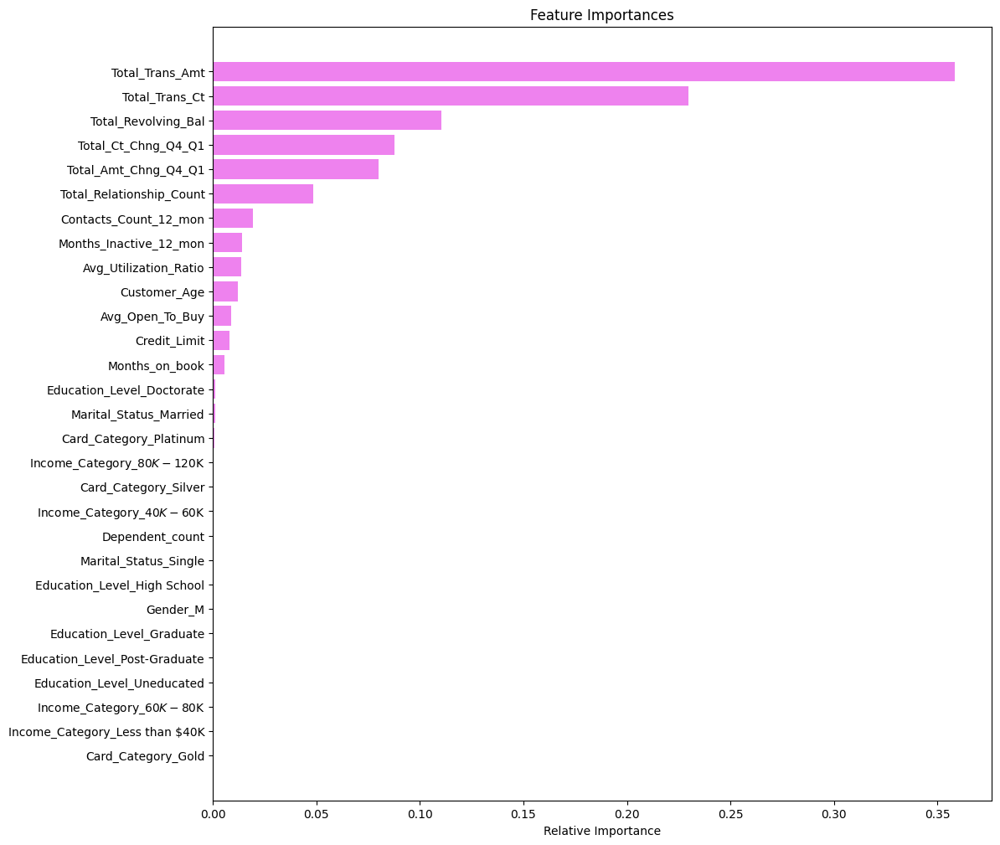

In [ ]:
feature_names = X_train.columns
importances = tuned_gbm1.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

*   We can see that Total_Trans_Amt, Total_Trans_Ct, and Total_Revolving_Bal are the most important features for making predictions.

# Business Insights and Conclusions

*   The amount and frequency of credit card usage directly impacts a customer staying as a customer.
*   The customers who attrit has much less usage amount and frequency.
*   The bank could offer incentives and rewards to current customers, such as points and cash back. They could also offer low or 0% interest rates for a period of time.


***

In [ ]:
!jupyter nbconvert --to html /content/drive/MyDrive/AIML_Program/Advanced_Machine_Learning/AML_Project_LearnerNotebook_FullCode.ipynb

[NbConvertApp] Converting notebook /content/drive/MyDrive/AIML_Program/Advanced_Machine_Learning/AML_Project_LearnerNotebook_FullCode.ipynb to html
[NbConvertApp] Writing 2115439 bytes to /content/drive/MyDrive/AIML_Program/Advanced_Machine_Learning/AML_Project_LearnerNotebook_FullCode.html
